In [11]:
# Warnings
import warnings
warnings.filterwarnings('ignore')

# Data handling libraries
import numpy as np
import pandas as pd

# Time for the control of the timing for proccesses
import time

# Data acquisition and saving files
import requests
import json
import os

# Data visualization
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt

In [12]:
all_info = []
for i in range(1,24):
    try:
        if i<10:
            with open(f"./Datos_meteorologicos/04_21_2012_0{i}_f.json", 'r') as f:
                print(i)
                value = json.load(f)
            all_info.append(value)
        elif i>=10:
            with open(f"./Datos_meteorologicos/04_21_2012_{i}_f.json", 'r') as f:
                print(i)
                value = json.load(f)
            all_info.append(value)
    except:
        pass


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23


<IPython.core.display.Javascript object>


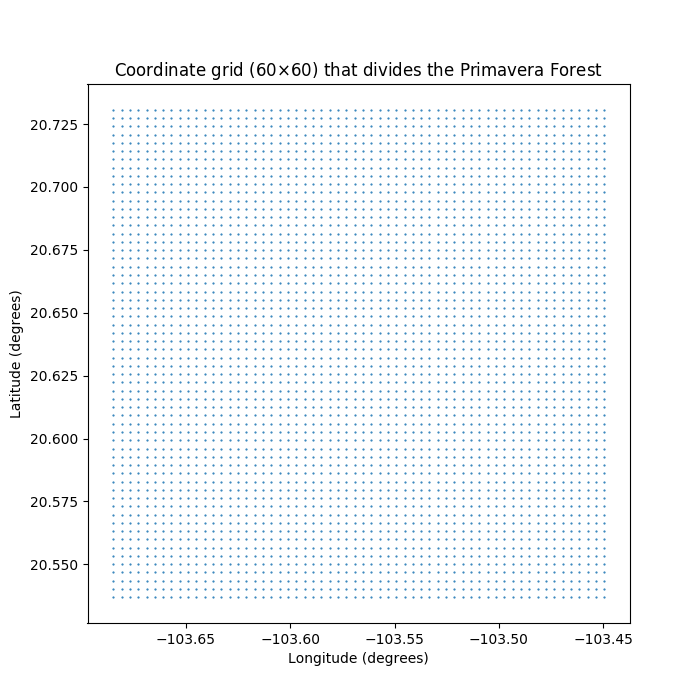

In [13]:
# Determine geospacial delimitations for the Primavera Forest 

# Delimitation coordinates
lat1, lon1 = 20.730654, -103.684725
lat2, lon2 = 20.536931, -103.684725
lat3, lon3 = 20.536931, -103.449552
lat4, lon4 = 20.730654, -103.449552
del_lat = [lat1,lat2,lat3,lat4]
del_lon = [lon1,lon2,lon3,lon4]

# Generate a grid for the data points:
lat_numbers = 60
lon_numbers = 60
lat_vector = np.linspace(min(del_lat), max(del_lat), lat_numbers)
lon_vector = np.linspace(min(del_lon), max(del_lon), lon_numbers)
lon,lat = np.meshgrid(lon_vector,lat_vector)

# Have all the coordinates in a vector and in a dataframe
coordinates = [[lat,lon] for lat in lat_vector for lon in lon_vector]
coordinates_df = pd.DataFrame(coordinates, columns=['latitude','longitude'])

# Plot the figure
plt.figure(figsize=(7,7))
plt.scatter(lon,lat, s=.3)
plt.title(f'Coordinate grid ({lon_numbers}$\\times${lat_numbers}) that divides the Primavera Forest')
plt.xlabel('Longitude (degrees)')
plt.ylabel('Latitude (degrees)')
plt.show()

In [14]:
information0 = []
for alpha in range(len(all_info)):
    print(alpha)
    try:
        information = pd.DataFrame([all_info[alpha][i]['currently'] for i in range(len(all_info[0]))])
        information['longitude'] = coordinates_df.longitude
        information['latitude'] = coordinates_df.latitude
        information['time_alpha']= (alpha+1)*np.ones(3600)
        information0.append(information)
    except:
        pass

information = pd.concat(information0, ignore_index=True)


fig = go.Figure(data=[go.Heatmap(x=information[information['time_alpha']==1].longitude,
                                 y=information[information['time_alpha']==1].latitude,
                                 z=information[information['time_alpha']==1].temperature)],
                layout= go.Layout(title="Temperature", updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])]),
                frames= [go.Frame(data=[go.Heatmap(x=information[information['time_alpha']==i+1].longitude,
                                                   y= information[information['time_alpha']==i+1].latitude, 
                                                   z=information[information['time_alpha']==i+1].temperature)]) for i in range(len(all_info))]
               )
fig.update_layout(width = 700, height = 700)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22


In [15]:
#temperature = [np.array(np.split(np.array([all_info[alpha][i]['currently']['temperature'] for i in range(len(all_info[0]))]),60)) for alpha in range(len(all_info))]
#sns.heatmap(temperature)

import matplotlib.animation as animation

<IPython.core.display.Javascript object>


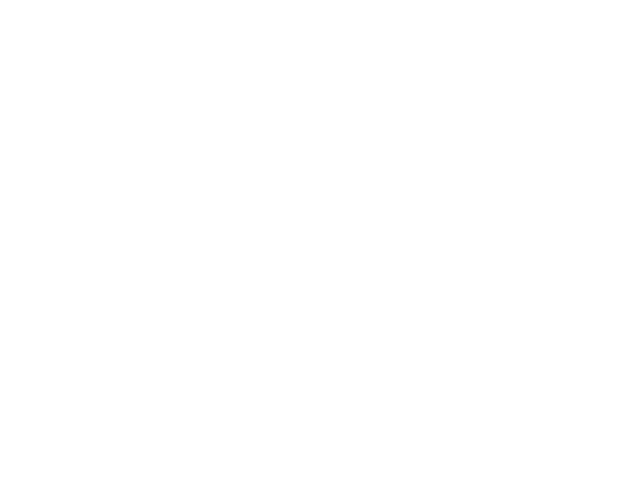

In [18]:
%matplotlib notebook

Writer = animation.writers['ffmpeg']
writer = Writer(fps=1, metadata=dict(artist='Me'), bitrate=100)
fig = plt.figure()
def animate(i):
    data = temperature[i]
    p = sns.heatmap(data, square=True, vmax=max(information.temperature), cbar=False)

ani = animation.FuncAnimation(fig , animate, frames=20, repeat=True)

In [ ]:
h=[pd.DataFrame([info4[i]['hourly']['data'][j] for i in range(len(info4))]) for j in range(0,24)]
current_info = [info4[i]['currently'] for i in range(len(info4))]
information = pd.DataFrame(current_info)
information['longitude'] = coordinates_df.longitude
information['latitude'] = coordinates_df.latitude

fig = go.Figure(data=[go.Heatmap(x=information.longitude, y=information.latitude, z=information.temperature)],
                layout= go.Layout(title="Temperature", updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])]),
                frames= [go.Frame(data=[go.Heatmap(x=information.longitude, y=information.latitude, z=h[i].temperature)]) for i in range(23)])
fig.update_layout(width = 700, height = 700)
fig.show()


information.describe().T
information = information[['time','temperature', 'dewPoint', 'humidity', 'windSpeed', 
                           'windBearing', 'cloudCover', 'longitude', 'latitude']]

met_correlations = information[['temperature','dewPoint','humidity', 'windSpeed', ]].corr()
met_correlations

sns.pairplot(information[['temperature','dewPoint','humidity', 'windSpeed']])

plt.subplot(711)
sns.heatmap(temperature , xticklabels=y_grid, yticklabels=x_grid[::-1])
plt.title('temperature')
plt.subplots_adjust(left=0,right=5, top=30, bottom=.0)


plt.subplot(712)
sns.heatmap(humidity, cmap='YlGnBu', xticklabels=y_grid, yticklabels=x_grid[::-1])
plt.title('humidity')


plt.subplot(713)
sns.heatmap(dewPoint, cmap='YlGnBu', xticklabels=y_grid, yticklabels=x_grid[::-1])
plt.title('dewPoint')


plt.subplot(714)
sns.heatmap(windSpeed, xticklabels=y_grid, yticklabels=x_grid[::-1])
plt.title('windSpeed')


plt.subplot(715)
sns.heatmap(windGust, cmap='YlGnBu', xticklabels=y_grid, yticklabels=x_grid[::-1])
plt.title('windGust')


plt.subplot(716)
sns.heatmap(windBearing, cmap='YlGnBu', xticklabels=y_grid, yticklabels=x_grid[::-1])
plt.title('windBearing')


plt.subplots_adjust(left=0,right=5, top=30, bottom=.0)
info4[0]['currently'].keys()
for j in range(24):
    hourly_data = [info4[i]['hourly']['data'][j] for i in range (len(info4))]
    hourly_data = pd.DataFrame(hourly_data)

    temperature = np.split(np.array(hourly_data.temperature), len(x_grid))[::-1]
    humidity  = np.split(np.array(hourly_data.humidity), len(x_grid))[::-1]
    dewPoint = np.split(np.array(hourly_data.dewPoint), len(x_grid))[::-1]
    windSpeed = np.split(np.array(hourly_data.windSpeed), len(x_grid))[::-1]
    windGust = np.split(np.array(hourly_data.windGust), len(x_grid))[::-1]
    windBearing = np.split(np.array(hourly_data.windBearing), len(x_grid))[::-1]
    cloudCover = np.split(np.array(hourly_data.cloudCover), len(x_grid))[::-1]
    #ozone = np.split(np.array(hourly_data.ozone), len(x_grid))[::-1]
    precipIntensity = np.split(np.array(hourly_data.precipIntensity), len(x_grid))[::-1]
    #pressure = np.split(np.array(hourly_data.pressure), len(x_grid))[::-1]

    plt.subplot(9,1,1)
    sns.heatmap(temperature,xticklabels=y_grid, yticklabels=x_grid[::-1])
    plt.title('temperature')

    plt.subplot(9,1,2)
    sns.heatmap(humidity, cmap='YlGnBu',xticklabels=y_grid, yticklabels=x_grid[::-1])
    plt.title('humidity')

    plt.subplot(9,1,3)
    sns.heatmap(dewPoint, cmap='YlGnBu',xticklabels=y_grid, yticklabels=x_grid[::-1])
    plt.title('dewPoint')

    plt.subplot(9,1,4)
    sns.heatmap(windSpeed, xticklabels=y_grid, yticklabels=x_grid[::-1])
    plt.title('windSpeed')

    plt.subplot(9,1,5)
    sns.heatmap(windGust, cmap='YlGnBu',xticklabels=y_grid, yticklabels=x_grid[::-1])
    plt.title('windGust')

    plt.subplot(9,1,6)
    sns.heatmap(windBearing, cmap='YlGnBu',xticklabels=y_grid, yticklabels=x_grid[::-1])
    plt.title('windBearing')

    plt.subplot(9,1,7)
    sns.heatmap(cloudCover, cmap='YlGnBu',xticklabels=y_grid, yticklabels=x_grid[::-1])
    plt.title('cloudCover')

    plt.subplot(9,1,8)
    sns.heatmap(precipIntensity, cmap='YlGnBu',xticklabels=y_grid, yticklabels=x_grid[::-1])
    plt.title('precipIntensity')

    plt.subplots_adjust(left=0,right=5, top=30, bottom=.0)
    if j<10:
        plt.savefig(f'./fig/{date}/0{j+1}.png')
    elif j>=10:
        plt.savefig(f'./fig/{date}/{j+1}.png')
        
import numpy as np
import plotly.figure_factory as ff
x1,y1 = np.meshgrid(x_grid,y_grid)
u1 = np.ones(len(x_grid))#np.array(windSpeed)/300
v1 = np.ones(len(x_grid))#np.sin(x1*10)*(.52)

fig = ff.create_quiver(y1, x1, u1, v1, line=dict(width=.1))
#fig2 = ff.create_streamline(x_grid, y_grid, u1, v1, arrow_scale=.1)

fig.show()

forest_fire = [pd.read_excel(f'./Serie_historica_anual_incendios_(20{i}).xlsx') for i in range(10,18)]
forest_fire[-1].columns

sns.heatmap(temperature)
x, y = np.meshgrid(x_grid,y_grid)
#h = plt.contourf(x,y[::-1],h2[-1])
h2 = np.gradient(temperature)
sns.heatmap(h2[1])
sns.heatmap(h2[0])
for element in forest_fire:
    print(set(element.columns))
    print('')